In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv("dataset.csv")

In [3]:
print(data)
data.head()

       Unnamed: 0                track_id                            artists  \
0               0  5SuOikwiRyPMVoIQDJUgSV                        Gen Hoshino   
1               1  4qPNDBW1i3p13qLCt0Ki3A                       Ben Woodward   
2               2  1iJBSr7s7jYXzM8EGcbK5b             Ingrid Michaelson;ZAYN   
3               3  6lfxq3CG4xtTiEg7opyCyx                       Kina Grannis   
4               4  5vjLSffimiIP26QG5WcN2K                   Chord Overstreet   
...           ...                     ...                                ...   
29234       29234  6X6wIzuxsh7GVNMPz1xTNa                   Hillsong Worship   
29235       29235  5y8ARSg47Yx52xvQQAlS35                         Mosaic MSC   
29236       29236  6PM55W7WiUmHVPdUebJP55                      Planetshakers   
29237       29237  0XEgJiDryoDd2gIJhVXghd  Bryan & Katie Torwalt;Brock Human   
29238       29238  3FjOBB4EyIXHYUtSgrIdY9                      Jesus Culture   

                                       

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,artist_popularity,duration_ms,explicit,danceability,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,58,230666,False,0.676,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,42,149610,False,0.420,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,54,210826,False,0.438,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,57,201933,False,0.266,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,59,198853,False,0.618,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [4]:
for col in data.columns:
    features=col
    print(features)

Unnamed: 0
track_id
artists
album_name
track_name
popularity
artist_popularity
duration_ms
explicit
danceability
energy
key
loudness
mode
speechiness
acousticness
instrumentalness
liveness
valence
tempo
time_signature
track_genre


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29239 entries, 0 to 29238
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         29239 non-null  int64  
 1   track_id           29239 non-null  object 
 2   artists            29239 non-null  object 
 3   album_name         29239 non-null  object 
 4   track_name         29239 non-null  object 
 5   popularity         29239 non-null  int64  
 6   artist_popularity  29239 non-null  int64  
 7   duration_ms        29239 non-null  int64  
 8   explicit           29239 non-null  bool   
 9   danceability       29239 non-null  float64
 10  energy             29239 non-null  float64
 11  key                29239 non-null  int64  
 12  loudness           29239 non-null  float64
 13  mode               29239 non-null  int64  
 14  speechiness        29239 non-null  float64
 15  acousticness       29239 non-null  float64
 16  instrumentalness   292

In [6]:


# Mapping dictionary
genre_mapping = {
    'acoustic': 'World/Folk',
    'afrobeat': 'World/Folk',
    'alt-rock': 'Rock',
    'ambient': 'Electronic',
    'anime': 'World/Folk',
    'black-metal': 'Rock',
    'bluegrass': 'World/Folk',
    'blues': 'World/Folk',
    'breakbeat': 'Electronic',
    'british': 'Rock',
    'chicago-house': 'Electronic',
    'chill': 'Electronic',
    'classical': 'Classical',
    'club': 'Electronic',
    'comedy': 'Other/Miscellaneous',
    'country': 'World/Folk',
    'dance': 'Pop',
    'dancehall': 'World/Folk',
    'death-metal': 'Rock',
    'deep-house': 'Electronic',
    'detroit-techno': 'Electronic',
    'disco': 'Pop',
    'drum-and-bass': 'Electronic',
    'dub': 'Electronic',
    'dubstep': 'Electronic',
    'edm': 'Pop',
    'electro': 'Electronic',
    'electronic': 'Electronic',
    'emo': 'Rock',
    'folk': 'World/Folk',
    'forro': 'World/Folk',
    'funk': 'World/Folk',
    'garage': 'World/Folk',
    'goth': 'Rock',
    'grindcore': 'Rock',
    'groove': 'World/Folk',
    'grunge': 'Rock',
    'guitar': 'World/Folk',
    'happy': 'Other/Miscellaneous',
    'hard-rock': 'Rock',
    'hardcore': 'Rock',
    'hardstyle': 'Electronic',
    'heavy-metal': 'Rock',
    'hip-hop': 'Hip-Hop/Rap',
    'honky-tonk': 'World/Folk',
    'house': 'Electronic',
    'idm': 'Electronic',
    'indie': 'Rock',
    'industrial': 'Rock',
    'j-dance': 'Electronic',
    'j-pop': 'Pop',
    'j-rock': 'Rock',
    'jazz': 'Jazz',
    'malay': 'World/Folk',
    'mandopop': 'Pop',
    'metal': 'Rock',
    'metalcore': 'Rock',
    'minimal-techno': 'Electronic',
    'mpb': 'World/Folk',
    'new-age': 'Classical',
    'party': 'Other/Miscellaneous',
    'piano': 'Classical',
    'pop-film': 'Pop',
    'pop': 'Pop',
    'power-pop': 'Pop',
    'progressive-house': 'Electronic',
    'psych-rock': 'Rock',
    'punk-rock': 'Rock',
    'punk': 'Rock',
    'r-n-b': 'Pop',
    'reggae': 'World/Folk',
    'reggaeton': 'World/Folk',
    'rock-n-roll': 'Rock',
    'rock': 'Rock',
    'rockabilly': 'World/Folk',
    'romance': 'Other/Miscellaneous',
    'sad': 'Other/Miscellaneous',
    'show-tunes': 'Other/Miscellaneous',
    'singer-songwriter': 'World/Folk',
    'ska': 'World/Folk',
    'sleep': 'Other/Miscellaneous',
    'soul': 'World/Folk',
    'study': 'Other/Miscellaneous',
    'synth-pop': 'Pop',
    'tango': 'World/Folk',
    'techno': 'Electronic',
    'trance': 'Electronic',
    'trip-hop': 'Electronic',
    'world-music': 'World/Folk'
}

# Apply the mapping
data['track_genre'] = data['track_genre'].replace(genre_mapping)



In [7]:
data=data.dropna()
data = data[data['popularity'] != 0]
data['instrumentalness'] = np.log(data['instrumentalness'].replace(0, np.nan)).fillna(0)
data['acousticness'] = np.log(data['acousticness'].replace(0, np.nan)).fillna(0)
data['speechiness'] = np.log(data['speechiness'].replace(0, np.nan)).fillna(0)
data['liveness'] = np.log(data['liveness'].replace(0, np.nan)).fillna(0)
data['duration_ms'] = np.log(data['duration_ms'].replace(0, np.nan)).fillna(0)


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29239 entries, 0 to 29238
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         29239 non-null  int64  
 1   track_id           29239 non-null  object 
 2   artists            29239 non-null  object 
 3   album_name         29239 non-null  object 
 4   track_name         29239 non-null  object 
 5   popularity         29239 non-null  int64  
 6   artist_popularity  29239 non-null  int64  
 7   duration_ms        29239 non-null  float64
 8   explicit           29239 non-null  bool   
 9   danceability       29239 non-null  float64
 10  energy             29239 non-null  float64
 11  key                29239 non-null  int64  
 12  loudness           29239 non-null  float64
 13  mode               29239 non-null  int64  
 14  speechiness        29239 non-null  float64
 15  acousticness       29239 non-null  float64
 16  instrumentalness   292

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
data_train, data_test = train_test_split(data.copy(),
                                            test_size=.2,
                                            random_state=440,
                                            shuffle=True)

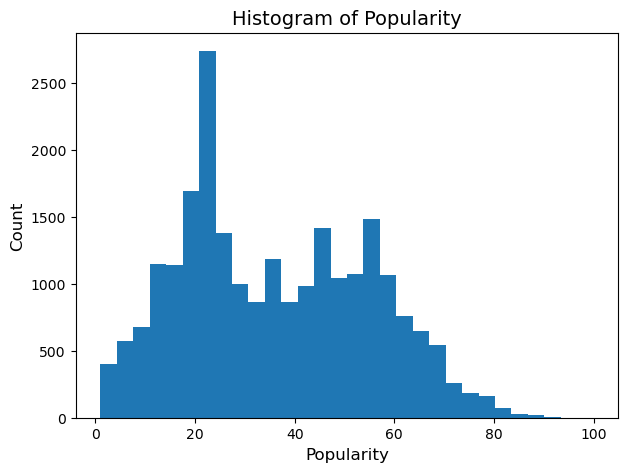

In [11]:
plt.figure(figsize=(7,5))

plt.hist(data_train.popularity, bins=30)

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.ylabel("Count", fontsize=12)
plt.xlabel("Popularity", fontsize=12)

plt.title("Histogram of Popularity", fontsize=14)

plt.show()


In [12]:
genres = data['track_genre'].unique().tolist()
print(genres)


['World/Folk', 'Rock', 'alternative', 'Electronic', 'Classical', 'Other/Miscellaneous', 'Pop', 'Hip-Hop/Rap', 'Jazz']


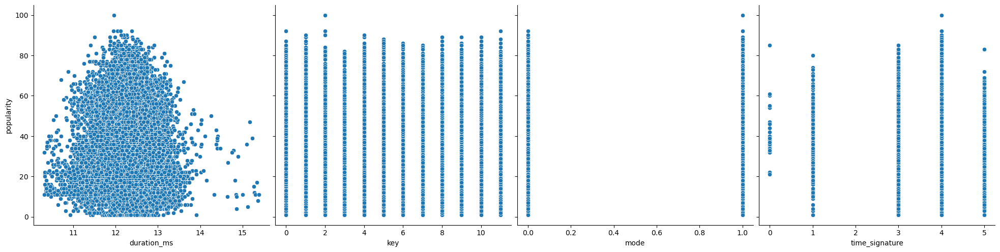

In [13]:
sns.pairplot(data_train,
                y_vars = ['popularity'],
                x_vars = ['duration_ms', 'key', 'mode', 'time_signature'],
                height = 5)

In [14]:
# Plot the pairplot
pairplot = sns.pairplot(data_train, kind='kde', hue='track_genre')  # Using 'kde' for kernel density estimation plots

# Show the plot
plt.show()

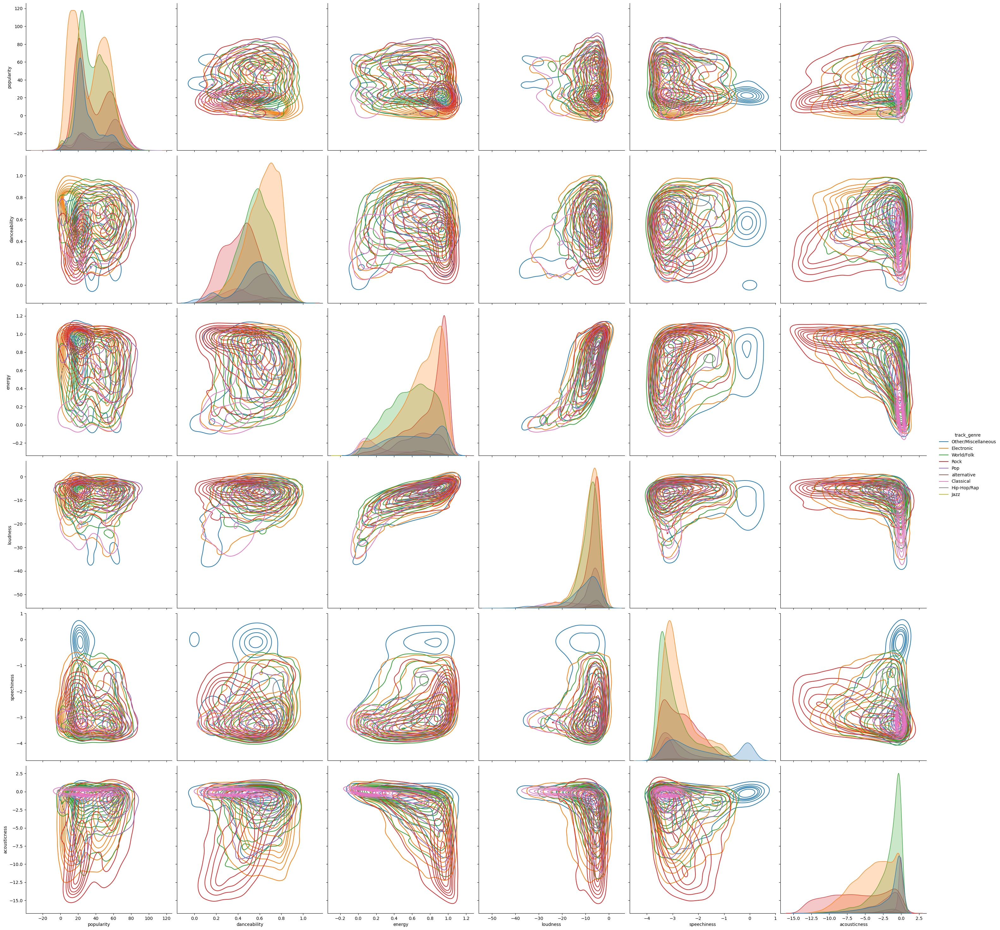

In [ ]:
from tarfile import data_filter


sns.pairplot(data_train,
                y_vars = ['popularity', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness'],
                x_vars = ['popularity', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness'],
                hue = 'track_genre',
                kind = 'kde',
                height = 5)

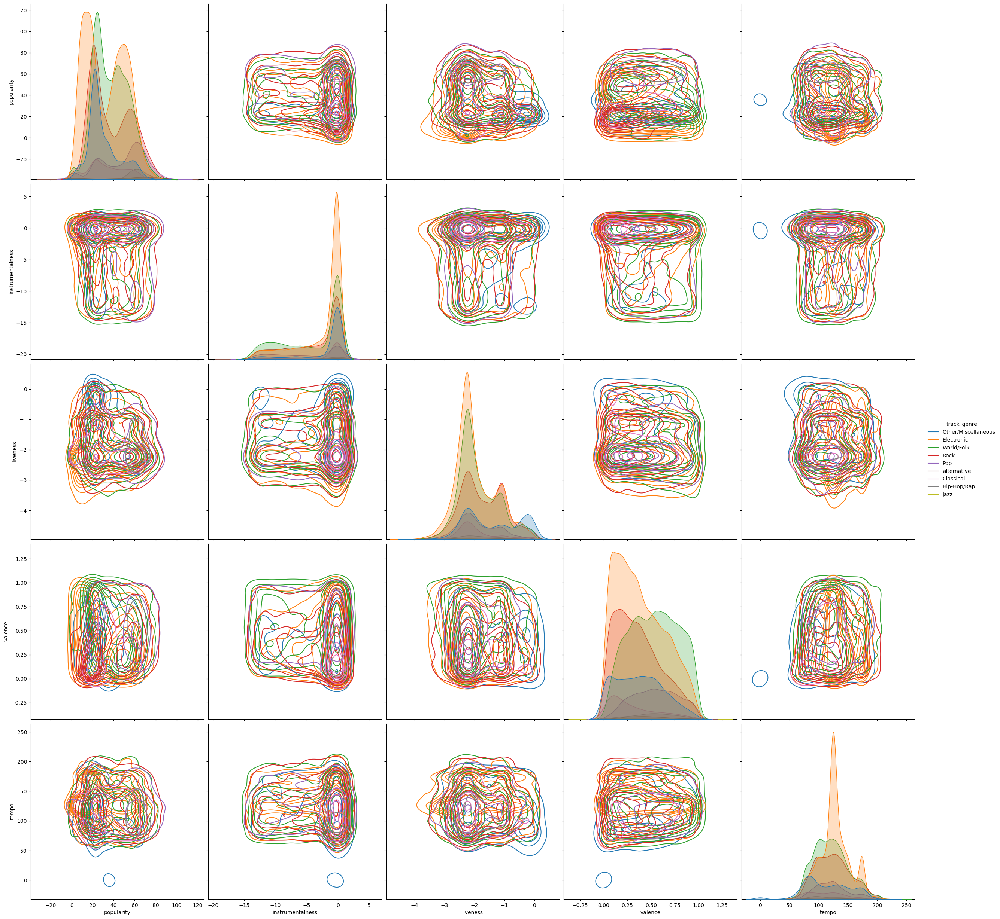

In [ ]:
sns.pairplot(data_train,
                y_vars = ['popularity', 'instrumentalness', 'liveness', 'valence', 'tempo'],
                x_vars = ['popularity', 'instrumentalness', 'liveness', 'valence', 'tempo'],
                hue = 'track_genre',
                kind = 'kde',
                height = 5)

KeyError: 'genre'

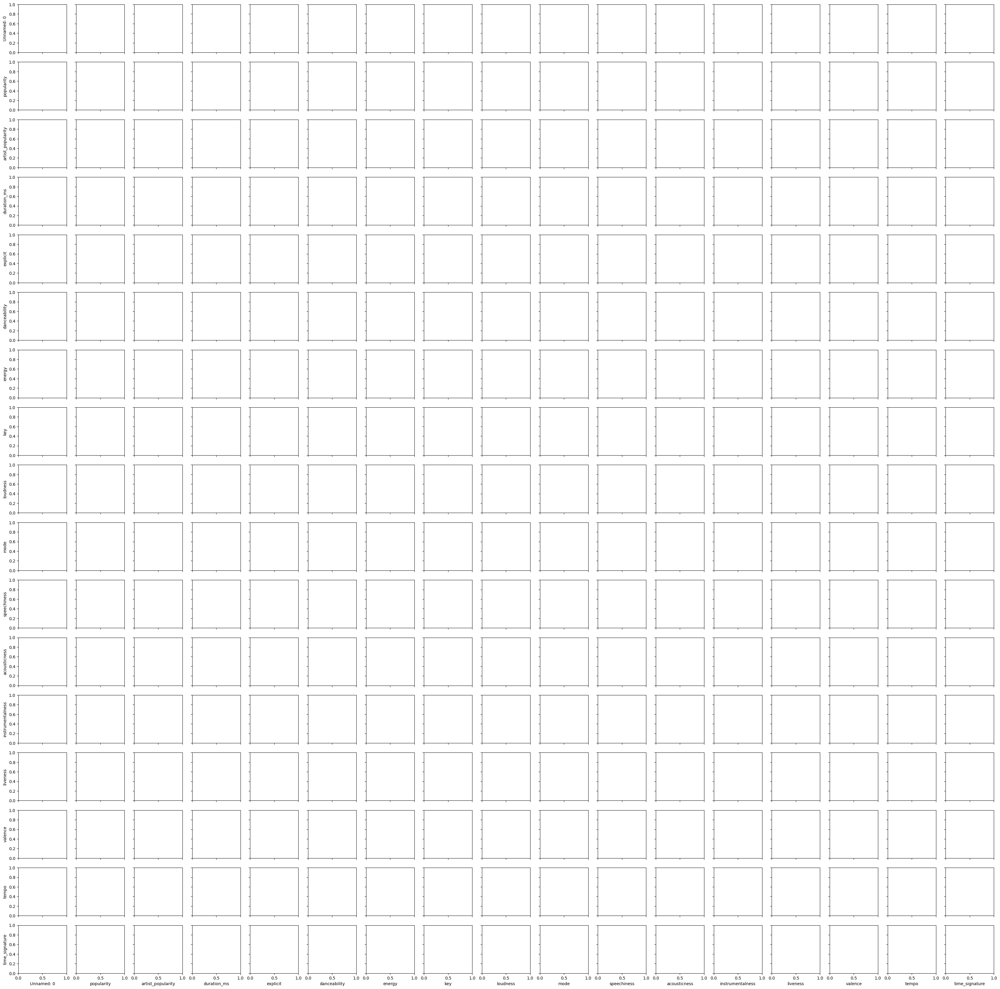

In [ ]:
g = sns.PairGrid(data_train, diag_sharey=False, hue = 'genre')
g.map_upper(sns.histplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot)